# Financial Data Analysis Project

In [1]:
# This project combines a number of projects and libraries in order to
# analyse real world financial data. It demonstrates visualization and
# Pandas skills as opposed to in depth financial analysis

In [2]:
from pandas_datareader import data, wb
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
# Use tiingo API to import stock data from 2006 to 2016 
# for the following banks:
# Bank of America
# CitiGroup
# Goldman Sachs
# JPMorgan Chase
# Morgan Stanley
# Wells Fargo

In [4]:
import os

In [5]:
import pandas_datareader as pdr

In [6]:
from tiingo import TiingoClient

config = {}
config['api_key'] = '4b487969284f396dc4ec4378961f48780c6e6bf0'
# 'api_key' is unique to allow access to the API
client = TiingoClient(config)

In [7]:
# Setting the date range and assigned ticker name

#Bank of America
BAC = client.get_dataframe("BAC",
                           startDate='2006-01-01',
                           endDate='2016-01-01')
    
#Citigroup
C = client.get_dataframe("C",
                         startDate='2006-01-01',
                         endDate='2016-01-01')
   
#Goldman Sachs
GS = client.get_dataframe("GS",
                          startDate='2006-01-01',
                          endDate='2016-01-01')
    
#JP Morgan
JPM = client.get_dataframe("JPM",
                           startDate='2006-01-01',
                           endDate='2016-01-01')
   
#Morgan Stanley
MS = client.get_dataframe("MS",
                          startDate='2006-01-01',
                          endDate='2016-01-01')

#Wells Fargo
WFC = client.get_dataframe("WFC",
                           startDate='2006-01-01',
                           endDate='2016-01-01')

In [8]:
BAC.info()
# Checking the contents of one acquired DataFrame

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2517 entries, 2006-01-03 00:00:00+00:00 to 2015-12-31 00:00:00+00:00
Data columns (total 12 columns):
adjClose       2517 non-null float64
adjHigh        2517 non-null float64
adjLow         2517 non-null float64
adjOpen        2517 non-null float64
adjVolume      2517 non-null int64
close          2517 non-null float64
divCash        2517 non-null float64
high           2517 non-null float64
low            2517 non-null float64
open           2517 non-null float64
splitFactor    2517 non-null float64
volume         2517 non-null int64
dtypes: float64(10), int64(2)
memory usage: 255.6 KB


In [9]:
# Assign ticker names to a list
tickers = ['BAC','C', 'GS', 'JPM', 'MS', 'WFC']

In [10]:
tickers

['BAC', 'C', 'GS', 'JPM', 'MS', 'WFC']

In [11]:
# Join the dataframes together with the keys set as the tickers list
bank_stocks = pd.concat([BAC,C,GS,JPM,MS,WFC],axis=1,keys=tickers)

In [12]:
# Set column name levels
bank_stocks.columns.names = ['Bank Ticker','Stock Info']

In [13]:
bank_stocks.head()

Bank Ticker                      BAC                                   \
Stock Info                  adjClose    adjHigh     adjLow    adjOpen   
date                                                                    
2006-01-03 00:00:00+00:00  33.991319  34.063518  33.319868  33.875800   
2006-01-04 00:00:00+00:00  33.630324  34.106837  33.536465  33.933560   
2006-01-05 00:00:00+00:00  33.673643  33.810821  33.442606  33.630324   
2006-01-06 00:00:00+00:00  33.623104  33.868580  33.464266  33.789161   
2006-01-09 00:00:00+00:00  33.644763  33.911900  33.471486  33.731402   

Bank Ticker                                                              ...  \
Stock Info                adjVolume  close divCash   high    low   open  ...   
date                                                                     ...   
2006-01-03 00:00:00+00:00  16296700  47.08     0.0  47.18  46.15  46.92  ...   
2006-01-04 00:00:00+00:00  17757900  46.58     0.0  47.24  46.45  47.00  ...   
2006-01-05 00:00:00+00:00  14970700  46.64     0.0  46.83  46.32  46.58  ...   
2006-01-06 00:00:00+00:00  12599800  46.57     0.0  46.91  46.35  46.80  ...   
2006-01-09 00:00:00+00:00  15619400  46.60     0.0  46.97  46.36  46.72  ...   

Bank Ticker                      WFC                                      \
Stock Info                    adjLow    adjOpen adjVolume  close divCash   
date                                                                       
2006-01-03 00:00:00+00:00  21.227997  21.503597  11016400  63.80     0.0   
2006-01-04 00:00:00+00:00  21.343681  21.639696  10870000  63.06     0.0   
2006-01-05 00:00:00+00:00  21.306254  21.435548  10158000  62.99     0.0   
2006-01-06 00:00:00+00:00  21.357291  21.489987   8403800  63.36     0.0   
2006-01-09 00:00:00+00:00  21.472975  21.554634   5619600  63.35     0.0   

Bank Ticker                                                          
Stock Info                  high    low   open splitFactor   volume  
date                                                                 
2006-01-03 00:00:00+00:00  63.95  62.39  63.20         1.0  5508200  
2006-01-04 00:00:00+00:00  63.64  62.73  63.60         1.0  5435000  
2006-01-05 00:00:00+00:00  63.11  62.62  63.00         1.0  5079000  
2006-01-06 00:00:00+00:00  63.55  62.77  63.16         1.0  4201900  
2006-01-09 00:00:00+00:00  63.65  63.11  63.35         1.0  2809800  

[5 rows x 72 columns]

# Exploratory Data Analysis

In [14]:
# Find the max close price for each stock during the time period
bank_stocks.xs(key='adjClose',axis=1,level='Stock Info').max()

Bank Ticker
BAC     41.098885
C      474.253115
GS     212.582574
JPM     62.650511
MS      60.590481
WFC     51.305379
dtype: float64

In [15]:
# Create an empty dataframe to hold stock returns
returns = pd.DataFrame()

In [16]:
# Use pct_change to calculate returns and populate dataframe
for tick in tickers:
    returns[tick+' Return'] = bank_stocks[tick]['adjClose'].pct_change()
returns.head()
    #for tick in list tickers
    #set the column title in returns df, column returns, to be tick + title
    #column values in 'close' column
    #equal to the value subject to function pct_change

,BAC Return,C Return,GS Return,JPM Return,MS Return,WFC Return
date,,,,,,
2006-01-03 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN
2006-01-04 00:00:00+00:00,-0.010620,-0.018462,-0.013812,-0.005723,0.000686,-0.011599
2006-01-05 00:00:00+00:00,0.001288,0.004961,-0.000393,0.003029,0.002742,-0.001110
2006-01-06 00:00:00+00:00,-0.001501,0.000000,0.014169,0.007046,0.001025,0.005874
2006-01-09 00:00:00+00:00,0.000644,-0.004731,0.012030,0.016242,0.010586,-0.000158


In [17]:
# Create a pairplot for a wide view of returns comparisons
import seaborn as sns

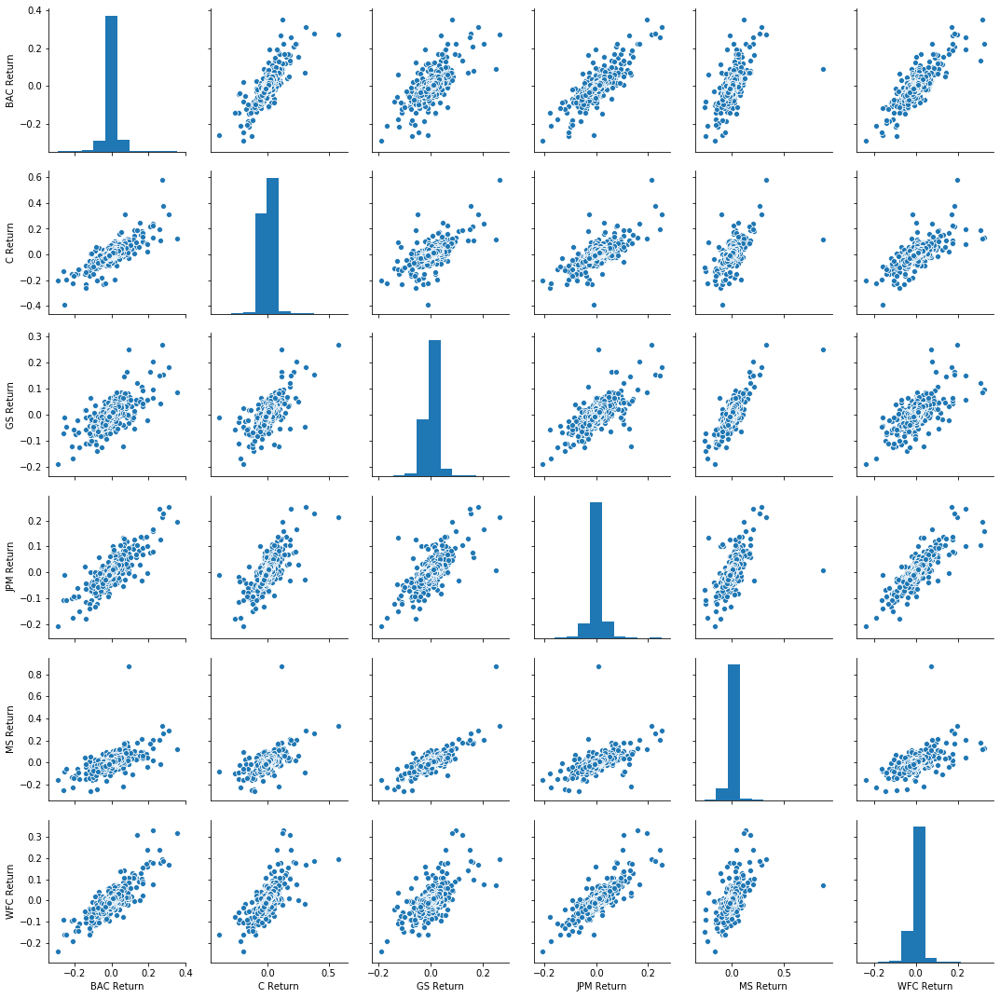

In [18]:
sns.pairplot(data=returns[1:])

In [19]:
# Find the dates for max/min returns for each stock in the period
returns.head()

,BAC Return,C Return,GS Return,JPM Return,MS Return,WFC Return
date,,,,,,
2006-01-03 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN
2006-01-04 00:00:00+00:00,-0.010620,-0.018462,-0.013812,-0.005723,0.000686,-0.011599
2006-01-05 00:00:00+00:00,0.001288,0.004961,-0.000393,0.003029,0.002742,-0.001110
2006-01-06 00:00:00+00:00,-0.001501,0.000000,0.014169,0.007046,0.001025,0.005874
2006-01-09 00:00:00+00:00,0.000644,-0.004731,0.012030,0.016242,0.010586,-0.000158


In [20]:
returns.idxmin()
# Note common date for min returns
# Date of Obama inauguration

BAC Return   2009-01-20 00:00:00+00:00
C Return     2009-02-27 00:00:00+00:00
GS Return    2009-01-20 00:00:00+00:00
JPM Return   2009-01-20 00:00:00+00:00
MS Return    2008-10-09 00:00:00+00:00
WFC Return   2009-01-20 00:00:00+00:00
dtype: datetime64[ns, UTC]

In [21]:
returns.idxmax()

BAC Return   2009-04-09 00:00:00+00:00
C Return     2008-11-24 00:00:00+00:00
GS Return    2008-11-24 00:00:00+00:00
JPM Return   2009-01-21 00:00:00+00:00
MS Return    2008-10-13 00:00:00+00:00
WFC Return   2008-07-16 00:00:00+00:00
dtype: datetime64[ns, UTC]

In [22]:
# Review standard deviation of returns to see riskiest stock
returns.std()
    #higher standard deviation equates to higher volatility
    #Citigroup therefore 'riskiest' over the considered period

BAC Return    0.036604
C Return      0.038659
GS Return     0.025354
JPM Return    0.027659
MS Return     0.037718
WFC Return    0.030178
dtype: float64

In [23]:
# Find riskiest stock of 2015
returns['2015-01-01':'2015-12-31'].std()
    #Highest standard deviation in 2015 at Morgan Stanley
    #Therefore considered riskiest in 2015

BAC Return    0.016173
C Return      0.015288
GS Return     0.014043
JPM Return    0.014005
MS Return     0.016284
WFC Return    0.012552
dtype: float64

Text(0.5, 1.0, 'Morgan Stanley Returns 2015')

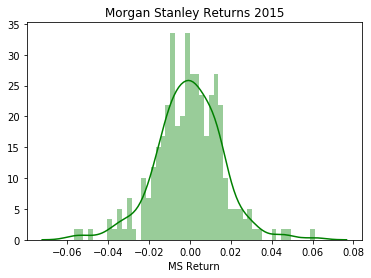

In [24]:
# Create a distplot of Morgan Stanley 2015 returns
sns.distplot(returns['2015-01-01':'2015-12-31']['MS Return'],
            bins=50,
            color='green')
plt.title('Morgan Stanley Returns 2015')

Text(0.5, 1.0, 'Citigroup Returns 2008')

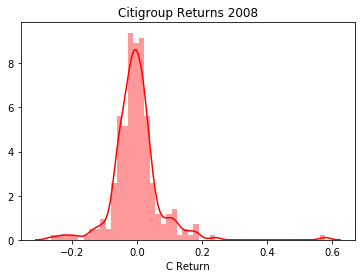

In [25]:
# Create a distplot of Citigroup 2008 returns
sns.distplot(returns['2008-01-01':'2008-12-31']['C Return'],
            bins=50,
            color='red')
plt.title('Citigroup Returns 2008')

# Further Visualization

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

# Optional Plotly Method Imports
import plotly
import cufflinks as cf
cf.go_offline()

In [27]:
# Plot close price for each bank through period
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [28]:
closevalue = bank_stocks.xs(key='adjClose',axis=1,level='Stock Info')

In [29]:
closevalue.max()

Bank Ticker
BAC     41.098885
C      474.253115
GS     212.582574
JPM     62.650511
MS      60.590481
WFC     51.305379
dtype: float64

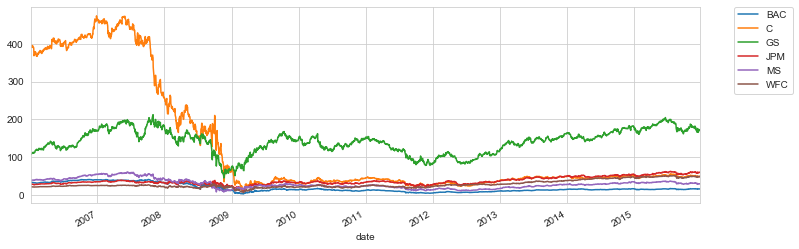

In [30]:
# Using matplotlib
closevalue.plot(figsize=(12,4))
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [31]:
closevalue.iplot()
#using plotly

In [32]:
# Plot 30 day rolling average for BAC for 2008

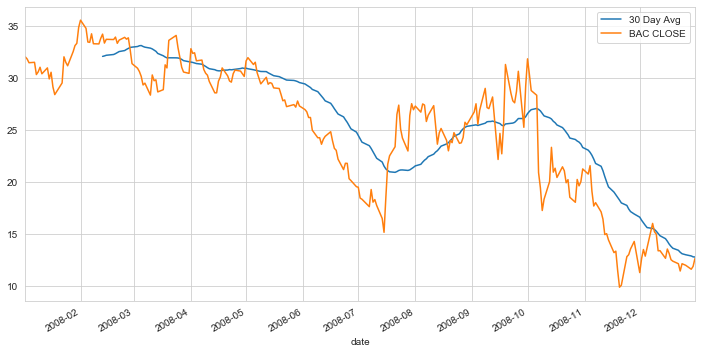

In [33]:
plt.figure(figsize=(12,6))
BAC['adjClose']['2008-01-01':'2009-01-01'].rolling(window=30).mean().plot(label='30 Day Avg')
BAC['adjClose']['2008-01-01':'2009-01-01'].plot(label='BAC CLOSE')
plt.legend()

In [34]:
# Create a heatmap of the correlation between the stocks Close Price
bank_stocks.xs(key='adjClose',axis=1,level='Stock Info').corr()

Bank Ticker,BAC,C,GS,JPM,MS,WFC
Bank Ticker,,,,,,
BAC,1.000000,0.957997,0.487539,-0.048549,0.920037,-0.108044
C,0.957997,1.000000,0.326549,-0.191287,0.869356,-0.227788
GS,0.487539,0.326549,1.000000,0.680967,0.718603,0.552409
JPM,-0.048549,-0.191287,0.680967,1.000000,0.184621,0.964809
MS,0.920037,0.869356,0.718603,0.184621,1.000000,0.100144
WFC,-0.108044,-0.227788,0.552409,0.964809,0.100144,1.000000


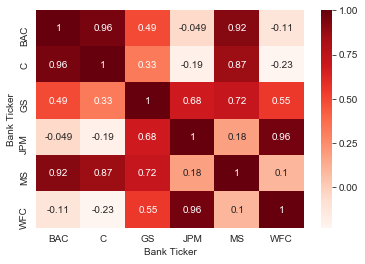

In [35]:
sns.heatmap(bank_stocks.xs(key='adjClose',axis=1,level='Stock Info').corr(),
           annot=True,
           cmap='Reds')

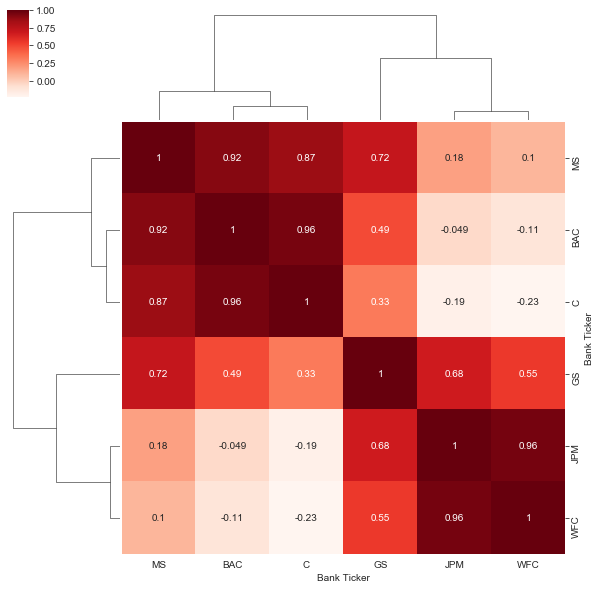

In [36]:
# Clustermap the correlations
sns.clustermap(bank_stocks.xs(key='adjClose',axis=1,level='Stock Info').corr(),
           annot=True,
           cmap='Reds')

In [37]:
# Create candle plot of BAC in 2016
import cufflinks as cf
from plotly.offline import download_plotlyjs,init_notebook_mode, plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [38]:
from plotly import graph_objs as go
import pandas as pd
from datetime import datetime

In [39]:
dates = BAC['2015-01-01':'2016-01-01']

fig = go.Figure(data=[go.Candlestick(x=dates,
                open=BAC['adjOpen'],
                high=BAC['adjHigh'],
                low=BAC['adjLow'],
                close=BAC['adjClose'])])
plt.tight_layout()
plt.show()

<Figure size 432x288 with 0 Axes>

In [40]:
BAC[['adjOpen','adjHigh','adjLow', 'adjClose']]['2015-01-01':'2016-01-01'].iplot(kind='candle')

In [41]:
# Create Simple Moving Averages plot of MS in 2015

In [42]:
MS['adjClose']['2015-01-01':'2016-01-01'].ta_plot(study='sma')

In [43]:
# Create a Bollinger Band Plot for BAC in 2015
BAC['adjClose']['2015-01-01':'2016-01-01'].ta_plot(study='boll')